# Neural Nutritional Network

# Bailey Fitts, Carrie Andrews-Smith, Matthew Schmitt

# IMPORTS


In [ ]:
#pip install tensorflow==2.15.0

In [8]:
#pip install tensorflow-datasets

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# IMPORTS


In [62]:
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import os
import pandas as pd
import re
import shutil
import stat
import seaborn as sns
import collections
import h5py
import numpy as np
import tensorflow as tf
import matplotlib.image as img
import random
import PIL
import requests
from matplotlib.image import imread
import matplotlib.pyplot as plt
import matplotlib.image as img
from PIL import Image
from os import listdir
from os.path import join
from os.path import isfile, join
from collections import defaultdict
from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets
from sklearn.model_selection import train_test_split
from skimage.io import imread
from keras.applications.inception_v3 import preprocess_input
from keras.models import load_model
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend 
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
from tensorflow.keras import models
from keras.utils import to_categorical
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image

%cd content/

%matplotlib inline

[Errno 2] No such file or directory: 'content/'
/home/mes4530/A Machine learning project song image classification


# Load the Food101 dataset, took me around 5-10min and takes 5gig space, sorry Dr. Brown :D

In [9]:
dataset, info = tfds.load('food101', split='train', with_info=True)

print(info)

2024-04-25 11:25:05.807841: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-25 11:25:05.850392: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-25 11:25:05.850430: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-25 11:25:05.851409: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-25 11:25:05.857935: I tensorflow/core/platform/cpu_feature_guar

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /home/mes4530/tensorflow_datasets/food101/2.0.0.incompleteM2WVXC/food101-train.tfrecord*...:   0%|  …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /home/mes4530/tensorflow_datasets/food101/2.0.0.incompleteM2WVXC/food101-validation.tfrecord*...:   …

Dataset food101 downloaded and prepared to /home/mes4530/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='food101',
    full_name='food101/2.0.0',
    description="""
    This dataset consists of 101 food categories, with 101'000 images. For each class, 250 manually reviewed test images are provided as well as 750 training images. On purpose, the training images were not cleaned, and thus still contain some amount of noise. This comes mostly in the form of intense colors and sometimes wrong labels. All images were rescaled to have a maximum side length of 512 pixels.
    """,
    homepage='https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/',
    data_dir=PosixGPath('/tmp/tmpo4egk5optfds'),
    file_format=tfrecord,
    download_size=4.65 GiB,
    dataset_size=4.77 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=10

# This will display all of the default different food classes (101) in a 12x12 

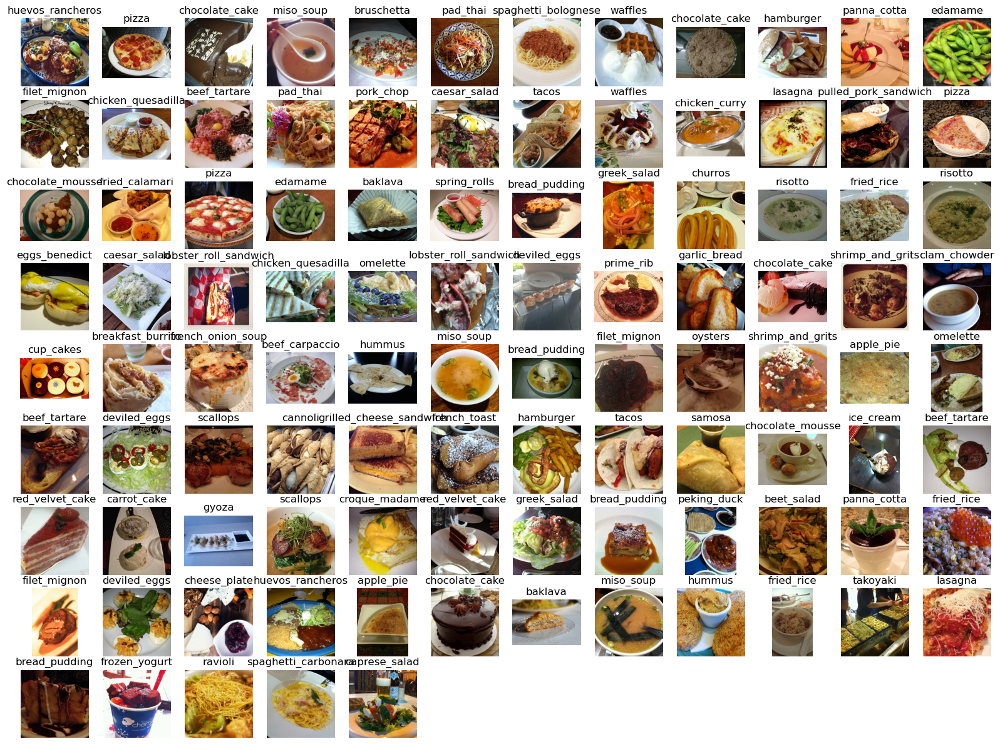

In [28]:
fig = plt.figure(figsize=(20, 20))
for i, example in enumerate(dataset.take(101)):  
    image = example['image']
    label = example['label']
    ax = fig.add_subplot(12, 12, i+1)
    ax.imshow(image)
    ax.set_title(info.features['label'].int2str(label.numpy()))
    ax.axis('off')
plt.show()

# 

# Class Indexing

In [2]:
class_N = {}
N_class = {}

with open('food-101/meta/classes.txt', 'r') as txt:
    classes = [i.strip() for i in txt.readlines()]
    
    class_N = dict(zip(classes, range(len(classes))))
    N_class = dict(zip(range(len(classes)), classes))

    class_N = {i: j for j, i in N_class.items()}

class_N_sorted = collections.OrderedDict(sorted(class_N.items()))
print(class_N)

{'apple_pie': 0, 'baby_back_ribs': 1, 'baklava': 2, 'beef_carpaccio': 3, 'beef_tartare': 4, 'beet_salad': 5, 'beignets': 6, 'bibimbap': 7, 'bread_pudding': 8, 'breakfast_burrito': 9, 'bruschetta': 10, 'caesar_salad': 11, 'cannoli': 12, 'caprese_salad': 13, 'carrot_cake': 14, 'ceviche': 15, 'cheesecake': 16, 'cheese_plate': 17, 'chicken_curry': 18, 'chicken_quesadilla': 19, 'chicken_wings': 20, 'chocolate_cake': 21, 'chocolate_mousse': 22, 'churros': 23, 'clam_chowder': 24, 'club_sandwich': 25, 'crab_cakes': 26, 'creme_brulee': 27, 'croque_madame': 28, 'cup_cakes': 29, 'deviled_eggs': 30, 'donuts': 31, 'dumplings': 32, 'edamame': 33, 'eggs_benedict': 34, 'escargots': 35, 'falafel': 36, 'filet_mignon': 37, 'fish_and_chips': 38, 'foie_gras': 39, 'french_fries': 40, 'french_onion_soup': 41, 'french_toast': 42, 'fried_calamari': 43, 'fried_rice': 44, 'frozen_yogurt': 45, 'garlic_bread': 46, 'gnocchi': 47, 'greek_salad': 48, 'grilled_cheese_sandwich': 49, 'grilled_salmon': 50, 'guacamole': 5

# Method to Generate Directory-File Map

In [3]:
def gen_dir_file_map(path):
    dir_files = defaultdict(list)
    with open(path, 'r') as txt:
        files = [i.strip() for i in txt.readlines()]
        for f in files:
            dir_name, id = f.split('/')
            dir_files[dir_name].append(id + '.jpg')
    return dir_files

# Method to Recursively Copy a Directory

In [4]:
def copytree(source, target, symlinks=False, ignore=None):

    if not os.path.exists(target):
        os.makedirs(target)
        shutil.copystat(source, target)
    
    data = os.listdir(source)
    
    if ignore:
        exclude = ignore(source, data)
        data = [x for x in data if x not in exclude]

    for item in data:
        src = os.path.join(source, item)
        dest = os.path.join(target, item)
        
        if symlinks and os.path.islink(src):
            if os.path.lexists(dest):
                os.remove(dest)
            os.symlink(os.readlink(src), dest)
            try:
                st = os.lstat(src)
                mode = stat.S_IMODE(st.st_mode)
                os.lchmod(dest, mode)
            except:
                pass

        elif os.path.isdir(src):
            copytree(src, dest, symlinks, ignore)

        else:
            shutil.copy2(src, dest)

# Functions to Ignore Training and Testing Files

In [5]:
def ignore_train(d, filenames):
    subdir = d.split('/')[-1]
    train_dir_files = gen_dir_file_map('food-101/meta/train.txt')
    to_ignore = train_dir_files[subdir]
    return to_ignore

def ignore_test(d, filenames):
    subdir = d.split('/')[-1]
    test_dir_files = gen_dir_file_map('food-101/meta/test.txt')
    to_ignore = test_dir_files[subdir]
    return to_ignore

# Method to Load and Resize Images

In [6]:
def load_images(path_to_imgs):
    resize_count = 0
    invalid_count = 0
    all_imgs = []
    all_classes = []

    for i, subdir in enumerate(listdir(path_to_imgs)):
        imgs = listdir(join(path_to_imgs, subdir))
        classN = class_N[subdir]
        for img_name in imgs:
            img = Image.open(join(path_to_imgs, subdir, img_name))
            img = img.resize((200, 200))
            img = np.array(img)
            all_imgs.append(img)
            all_classes.append(classN)
            
    return np.array(all_imgs), np.array(all_classes)

# Methods to Generate Train-Test Split and Load Data

In [7]:
def gen_train_test_split(path_to_imgs='food-101/images', target_path='food-101'):
    copytree(path_to_imgs, target_path + '/train', ignore=ignore_test)
    copytree(path_to_imgs, target_path + '/test', ignore=ignore_train)

def load_train_test_data(path_to_train_imgs, path_to_test_imgs):
    X_train, y_train = load_images(path_to_train_imgs)
    X_test, y_test = load_images(path_to_test_imgs)
    return X_train, y_train, X_test, y_test

# Checks if the files are present and shows how many folders for each

In [8]:
if not os.path.isdir('./food-101/test') and not os.path.isdir('./food-101/train'):
    gen_train_test_split(path_to_imgs='./food-101/images', target_path='./food-101')  
    len_train = len(os.listdir('./food-101/train'))
    len_test = len(os.listdir('./food-101/test'))
    print(len_train, len_test)
else:
    print('train and test folders already exist.')
    len_train = len(os.listdir('./food-101/train'))
    len_test = len(os.listdir('./food-101/test'))
    print(len_train, len_test)


train and test folders already exist.
101 101


# Lists all the classes of foods

In [9]:
foods_sorted = sorted(os.listdir('food-101/images'))
foods_sorted

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

# Selects a random class from train and selects 5 images from it

(384, 512, 3)


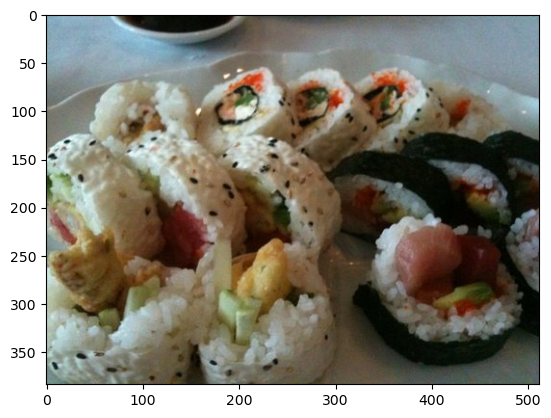

(384, 512, 3)


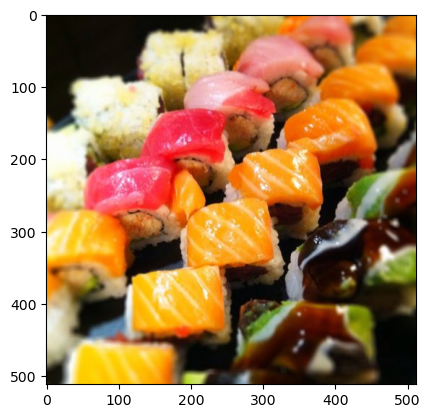

(384, 512, 3)


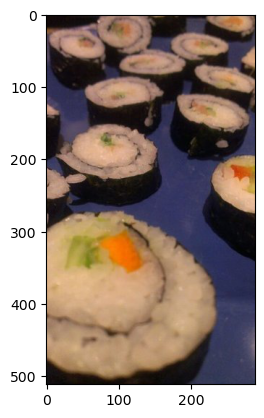

(384, 512, 3)


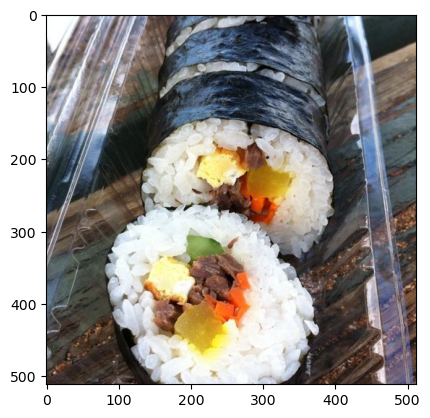

(384, 512, 3)


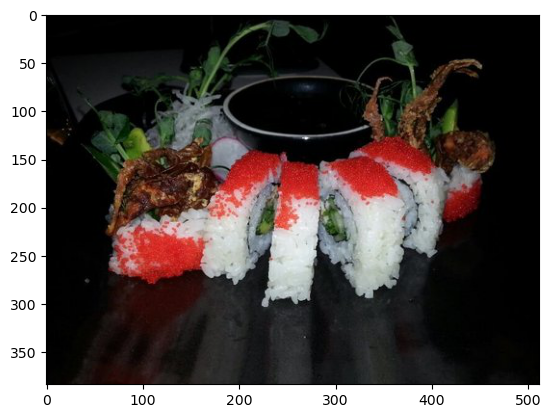

In [55]:
food_categories = [
    'apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare',
    'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito',
    'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake',
    'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla',
    'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder',
    'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes',
    'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots',
    'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries',
    'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt',
    'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon',
    'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros',
    'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich',
    'macaroni_and_cheese', 'macarons', 'miso_soup', 'mussels', 'nachos', 'omelette',
    'onion_rings', 'oysters', 'pad_thai', 'paella', 'pancakes', 'panna_cotta',
    'peking_duck', 'pho', 'pizza', 'pork_chop', 'poutine', 'prime_rib',
    'pulled_pork_sandwich', 'ramen', 'ravioli', 'red_velvet_cake', 'risotto',
    'samosa', 'sashimi', 'scallops', 'seaweed_salad', 'shrimp_and_grits',
    'spaghetti_bolognese', 'spaghetti_carbonara', 'spring_rolls', 'steak',
    'strawberry_shortcake', 'sushi', 'tacos', 'takoyaki', 'tiramisu', 'tuna_tartare',
    'waffles'
]

random_category = random.choice(food_categories)

category_dir = os.path.join('food-101/test', random_category)
category_imgs = [os.path.join(category_dir, f) for f in os.listdir(category_dir) if f.endswith('.jpg')]

selected_imgs = random.sample(category_imgs, 5)

for img_path in selected_imgs:
    img = imread(img_path)
    plt.figure()
    plt.imshow(img)
    print(testImg.shape)
    plt.show()

# Conversion to RGB format, resizes, then coverts to numpy array

In [44]:
def load_images(path_to_imgs, target_size=(200, 200)):
    resize_count = 0
    invalid_count = 0
    all_imgs = []
    all_classes = []

    for i, subdir in enumerate(listdir(path_to_imgs)):
        imgs = listdir(join(path_to_imgs, subdir))
        classN = class_N[subdir]
        for img_name in imgs:
            img = Image.open(join(path_to_imgs, subdir, img_name))
            img = img.convert('RGB')  
            img = img.resize(target_size)
            img = np.array(img)
            all_imgs.append(img)
            all_classes.append(classN)
            
    return np.array(all_imgs), np.array(all_classes)


# Assigning train test with function (takes around 15min on dive10)

In [56]:
X_train, y_train, X_test, y_test = load_train_test_data('food-101/train', 'food-101/test')

# Augmentation and flow training test and train

In [58]:
tf.keras.backend.clear_session()

n_classes = 101
batch_size = 16
width, height = 200, 200
train_data = 'food-101/train'
test_data = 'food-101/test'
train_samples = 75750
test_samples = 25250

train_data_gen = ImageDataGenerator(rescale=1. / 255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
test_data_gen = ImageDataGenerator(rescale=1. / 255)

train_gen = train_data_gen.flow_from_directory(train_data, target_size=(height, width), batch_size=batch_size, class_mode='categorical')

test_gen = test_data_gen.flow_from_directory(test_data, target_size=(height, width), batch_size=batch_size, class_mode='categorical')

Found 75750 images belonging to 101 classes.
Found 25250 images belonging to 101 classes.


# Inceptionv3 Neural network training (1 hour per epoch dive 10)

In [ ]:
inception = InceptionV3(weights='imagenet', include_top=False)
layer = inception.output
layer = GlobalAveragePooling2D()(layer)
layer = Dense(128,activation='relu')(layer)
layer = Dropout(0.2)(layer)

predictions = Dense(n_classes,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(layer)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='Neural_Nutritional_Network_Model.hdf5', save_best_only=True)
csv_logger = CSVLogger('Training_History.log')

Training_History = model.fit(train_gen, steps_per_epoch= train_samples // batch_size, validation_data= test_gen, validation_steps= test_samples // batch_size, epochs=30, callbacks=[csv_logger, checkpointer])



# Adding additional epochs to the model (1 hour per epoch dive 10)

In [ ]:
model = load_model('Neural_Nutritional_Network_Model.hdf5')

model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

additional_epochs = 6  # change to match the amount of epochs adding, do not do more then 3 if using vpn

checkpointer = ModelCheckpoint(filepath='Neural_Nutritional_Network_Model.hdf5', save_best_only=True)
csv_logger = CSVLogger('Training_History.log', append=True)

Training_History = model.fit(train_gen,
                              steps_per_epoch=train_samples // batch_size,
                              validation_data=test_gen,
                              validation_steps=test_samples // batch_size,
                              epochs=additional_epochs,
                              callbacks=[csv_logger, checkpointer])

# food class map from training

In [59]:
class_map_101 = train_gen.class_indices
class_map_101

{'apple_pie': 0,
 'baby_back_ribs': 1,
 'baklava': 2,
 'beef_carpaccio': 3,
 'beef_tartare': 4,
 'beet_salad': 5,
 'beignets': 6,
 'bibimbap': 7,
 'bread_pudding': 8,
 'breakfast_burrito': 9,
 'bruschetta': 10,
 'caesar_salad': 11,
 'cannoli': 12,
 'caprese_salad': 13,
 'carrot_cake': 14,
 'ceviche': 15,
 'cheese_plate': 16,
 'cheesecake': 17,
 'chicken_curry': 18,
 'chicken_quesadilla': 19,
 'chicken_wings': 20,
 'chocolate_cake': 21,
 'chocolate_mousse': 22,
 'churros': 23,
 'clam_chowder': 24,
 'club_sandwich': 25,
 'crab_cakes': 26,
 'creme_brulee': 27,
 'croque_madame': 28,
 'cup_cakes': 29,
 'deviled_eggs': 30,
 'donuts': 31,
 'dumplings': 32,
 'edamame': 33,
 'eggs_benedict': 34,
 'escargots': 35,
 'falafel': 36,
 'filet_mignon': 37,
 'fish_and_chips': 38,
 'foie_gras': 39,
 'french_fries': 40,
 'french_onion_soup': 41,
 'french_toast': 42,
 'fried_calamari': 43,
 'fried_rice': 44,
 'frozen_yogurt': 45,
 'garlic_bread': 46,
 'gnocchi': 47,
 'greek_salad': 48,
 'grilled_cheese_sa

# Visualizing validation accuracy and loss over epochs

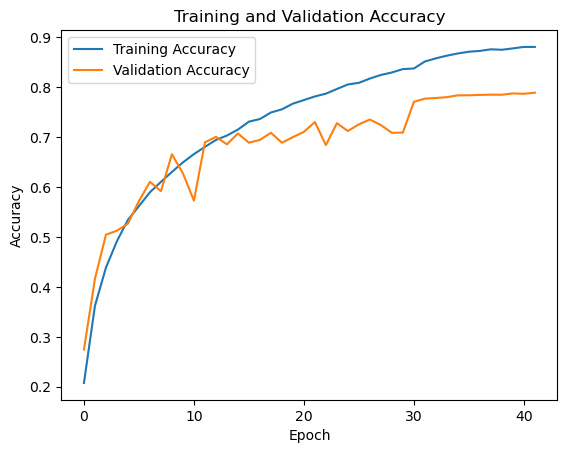

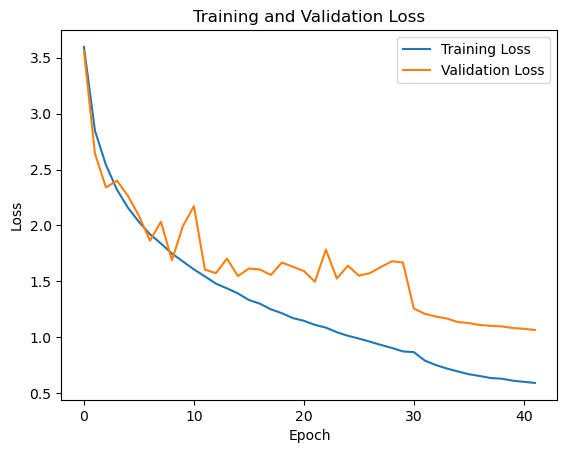

In [4]:
history = pd.read_csv('Training_History.log')

plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Sorting food classes

In [5]:
foods_sorted = sorted(os.listdir('food-101/images'))
foods_sorted

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

# USDA Nutritional API (replace key if using in future guide below)

In [ ]:
#https://fdc.nal.usda.gov/api-guide.html

In [1]:
api_key = 'C2vY7IlkD8fsjobNKYmge1ezdNsL72QaEMmgm7sa'

# List of foods to search for
foods = ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets',
         'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad',
         'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla',
         'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich',
         'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings',
         'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras',
         'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt',
         'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole',
         'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna',
         'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_soup', 'mussels',
         'nachos', 'omelette', 'onion_rings', 'oysters', 'pad_thai', 'paella', 'pancakes', 'panna_cotta',
         'peking_duck', 'pho', 'pizza', 'pork_chop', 'poutine', 'prime_rib', 'pulled_pork_sandwich', 'ramen',
         'ravioli', 'red_velvet_cake', 'risotto', 'samosa', 'sashimi', 'scallops', 'seaweed_salad',
         'shrimp_and_grits', 'spaghetti_bolognese', 'spaghetti_carbonara', 'spring_rolls', 'steak',
         'strawberry_shortcake', 'sushi', 'tacos', 'takoyaki', 'tiramisu', 'tuna_tartare', 'waffles']


for food in foods:
    url = f'https://api.nal.usda.gov/fdc/v1/foods/search?api_key={api_key}&query={food}'
    response = requests.get(url)
    data = response.json()
    if data['foods']:
        print(f"Food: {food}")
        print("Details:")
        print(data['foods'][0])  
        print()
    else:
        print(f"No results found for {food}")

No results found for apple_pie
No results found for baby_back_ribs
Food: baklava
Details:
{'fdcId': 2343527, 'description': 'Baklava', 'commonNames': '', 'additionalDescriptions': 'Kadayif', 'dataType': 'Survey (FNDDS)', 'foodCode': 53441110, 'publishedDate': '2022-10-28', 'foodCategory': 'Cakes and pies', 'foodCategoryId': 2646725, 'allHighlightFields': '', 'score': 1725.509, 'microbes': [], 'foodNutrients': [{'nutrientId': 1003, 'nutrientName': 'Protein', 'nutrientNumber': '203', 'unitName': 'G', 'value': 6.6, 'rank': 600, 'indentLevel': 1, 'foodNutrientId': 28720379}, {'nutrientId': 1004, 'nutrientName': 'Total lipid (fat)', 'nutrientNumber': '204', 'unitName': 'G', 'value': 29.0, 'rank': 800, 'indentLevel': 1, 'foodNutrientId': 28720380}, {'nutrientId': 1005, 'nutrientName': 'Carbohydrate, by difference', 'nutrientNumber': '205', 'unitName': 'G', 'value': 37.8, 'rank': 1110, 'indentLevel': 2, 'foodNutrientId': 28720381}, {'nutrientId': 1008, 'nutrientName': 'Energy', 'nutrientNumbe

# Doing it again but putting it inside a dataframe instead

In [2]:
api_key = 'C2vY7IlkD8fsjobNKYmge1ezdNsL72QaEMmgm7sa'

foods = ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets',
         'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad',
         'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla',
         'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich',
         'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings',
         'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras',
         'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt',
         'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole',
         'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna',
         'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_soup', 'mussels',
         'nachos', 'omelette', 'onion_rings', 'oysters', 'pad_thai', 'paella', 'pancakes', 'panna_cotta',
         'peking_duck', 'pho', 'pizza', 'pork_chop', 'poutine', 'prime_rib', 'pulled_pork_sandwich', 'ramen',
         'ravioli', 'red_velvet_cake', 'risotto', 'samosa', 'sashimi', 'scallops', 'seaweed_salad',
         'shrimp_and_grits', 'spaghetti_bolognese', 'spaghetti_carbonara', 'spring_rolls', 'steak',
         'strawberry_shortcake', 'sushi', 'tacos', 'takoyaki', 'tiramisu', 'tuna_tartare', 'waffles']

food_results = []
food_details = []

for food in foods:
    url = f'https://api.nal.usda.gov/fdc/v1/foods/search?api_key={api_key}&query={food}'
    response = requests.get(url)
    data = response.json()
    if 'foods' in data:
        if data['foods']:
            food_results.append('Found')
            food_details.append(data['foods'])  # Store all results
        else:
            food_results.append('Not Found')
            food_details.append(None)
    else:
        food_results.append('Error')
        food_details.append(None)

df = pd.DataFrame({
    'Food': foods,
    'Result': food_results,
    'Details': food_details
})

df.to_csv('food_results.csv', index=False)

print("Food Result Details")
print(df)

Food Result Details
               Food     Result  \
0         apple_pie  Not Found   
1    baby_back_ribs  Not Found   
2           baklava      Found   
3    beef_carpaccio  Not Found   
4      beef_tartare  Not Found   
..              ...        ...   
96            tacos      Found   
97         takoyaki  Not Found   
98         tiramisu      Found   
99     tuna_tartare  Not Found   
100         waffles      Found   

                                               Details  
0                                                 None  
1                                                 None  
2    [{'fdcId': 2343527, 'description': 'Baklava', ...  
3                                                 None  
4                                                 None  
..                                                 ...  
96   [{'fdcId': 170736, 'description': 'TACO BELL, ...  
97                                                None  
98   [{'fdcId': 2341105, 'description': 'Tiramisu',...  
9

# Visualize the dataframe

In [4]:
df = pd.read_csv('food_results.csv')

df

,Food,Result,Details
0,apple_pie,Not Found,NaN
1,baby_back_ribs,Not Found,NaN
2,baklava,Found,"[{'fdcId': 2343527, 'description': 'Baklava', ..."
3,beef_carpaccio,Not Found,NaN
4,beef_tartare,Not Found,NaN
...,...,...,...
96,tacos,Found,"[{'fdcId': 170736, 'description': 'TACO BELL, ..."
97,takoyaki,Not Found,NaN
98,tiramisu,Found,"[{'fdcId': 2341105, 'description': 'Tiramisu',..."
99,tuna_tartare,Not Found,NaN


# Adding new columns with USDA info and manually entering data

In [6]:
df = pd.read_csv("food_results.csv")

def extract_nutrient_value(details, nutrient_name):
    if isinstance(details, str):
        pattern = rf"'nutrientName': '{nutrient_name}', 'nutrientNumber': '\d+', 'unitName': 'G', 'value': (\d+\.\d+)"
        match = re.search(pattern, details)
        if match:
            return match.group(1)
    return np.nan

df['Protein_Grams'] = df['Details'].apply(lambda x: extract_nutrient_value(x, 'Protein'))
df['Fat_Grams'] = df['Details'].apply(lambda x: extract_nutrient_value(x, 'Total lipid \(fat\)'))
df['Carbohydrate_Grams'] = df['Details'].apply(lambda x: extract_nutrient_value(x, 'Carbohydrate, by difference'))

def extract_energy_value(details):
    if isinstance(details, str):
        pattern = r"'nutrientName': 'Energy', 'nutrientNumber': '208', 'unitName': 'KCAL', 'value': (\d+)"
        match = re.search(pattern, details)
        if match:
            return match.group(1)
    return np.nan

df['Calories'] = df['Details'].apply(extract_energy_value)

df.drop(columns=['Details', 'Result'], inplace=True)

replacement_values = {'Food': 'apple_pie', 'Calories': 1662, 'Fat_Grams': 78, 'Protein_Grams': 13.2, 'Carbohydrate_Grams': 240}

df.loc[df['Food'] == 'apple_pie', ['Calories', 'Fat_Grams', 'Protein_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'apple_pie', ['Calories', 'Fat_Grams', 'Protein_Grams', 'Carbohydrate_Grams']].fillna(replacement_values)

baby_back_ribs_values = {'Food': 'baby_back_ribs', 'Calories': 668, 'Protein_Grams': 48, 'Fat_Grams': 45, 'Carbohydrate_Grams': 13}

df.loc[df['Food'] == 'baby_back_ribs', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'baby_back_ribs', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(baby_back_ribs_values)

beef_carpaccio_values = {'Food': 'beef_carpaccio', 'Calories': 362, 'Protein_Grams': 26, 'Fat_Grams': 26, 'Carbohydrate_Grams': 4}

df.loc[df['Food'] == 'beef_carpaccio', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'beef_carpaccio', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(beef_carpaccio_values)

beef_tartare_values = {'Food': 'beef_tartare', 'Calories': 552, 'Protein_Grams': 33, 'Fat_Grams': 44, 'Carbohydrate_Grams': 5}

df.loc[df['Food'] == 'beef_tartare', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'beef_tartare', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(beef_tartare_values)


beet_salad_values = {'Food': 'beet_salad', 'Calories': 598, 'Protein_Grams': 11, 'Fat_Grams': 52, 'Carbohydrate_Grams': 24}

df.loc[df['Food'] == 'beet_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'beet_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(beet_salad_values)

bread_pudding_values = {'Food': 'bread_pudding', 'Calories': 377, 'Protein_Grams': 7.7, 'Fat_Grams': 7.3, 'Carbohydrate_Grams': 72}

df.loc[df['Food'] == 'bread_pudding', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'bread_pudding', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(bread_pudding_values)

breakfast_burrito_values = {'Food': 'breakfast_burrito', 'Calories': 657, 'Protein_Grams': 29, 'Fat_Grams': 28, 'Carbohydrate_Grams': 72}

df.loc[df['Food'] == 'breakfast_burrito', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'breakfast_burrito', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(breakfast_burrito_values)


caesar_salad_values = {'Food': 'caesar_salad', 'Calories': 481, 'Protein_Grams': 10, 'Fat_Grams': 40, 'Carbohydrate_Grams': 23}

df.loc[df['Food'] == 'caesar_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'caesar_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(caesar_salad_values)

caprese_salad_values = {'Food': 'caprese_salad', 'Calories': 440, 'Protein_Grams': 26, 'Fat_Grams': 34, 'Carbohydrate_Grams': 9.4}

df.loc[df['Food'] == 'caprese_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'caprese_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(caprese_salad_values)

carrot_cake_values = {'Food': 'carrot_cake', 'Calories': 577, 'Protein_Grams': 6.6, 'Fat_Grams': 30, 'Carbohydrate_Grams': 73}

df.loc[df['Food'] == 'carrot_cake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'carrot_cake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(carrot_cake_values)

cheese_plate_values = {'Food': 'cheese_plate', 'Calories': 662, 'Protein_Grams': 45, 'Fat_Grams': 50, 'Carbohydrate_Grams': 8.3}

df.loc[df['Food'] == 'cheese_plate', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'cheese_plate', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(cheese_plate_values)

chicken_curry_values = {'Food': 'chicken_curry', 'Calories': 486, 'Protein_Grams': 56, 'Fat_Grams': 22, 'Carbohydrate_Grams': 15}

df.loc[df['Food'] == 'chicken_curry', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'chicken_curry', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(chicken_curry_values)

chicken_quesadilla_values = {'Food': 'chicken_quesadilla', 'Calories': 1069, 'Protein_Grams': 61, 'Fat_Grams': 50, 'Carbohydrate_Grams': 92}

df.loc[df['Food'] == 'chicken_quesadilla', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'chicken_quesadilla', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(chicken_quesadilla_values)


chicken_wings_values = {'Food': 'chicken_wings', 'Calories': 88, 'Protein_Grams': 4.5, 'Fat_Grams': 6.5, 'Carbohydrate_Grams': 2.6}

df.loc[df['Food'] == 'chicken_wings', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'chicken_wings', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(chicken_wings_values)

chocolate_cake_values = {'Food': 'chocolate_cake', 'Calories': 424, 'Protein_Grams': 3.8, 'Fat_Grams': 22, 'Carbohydrate_Grams': 58}

df.loc[df['Food'] == 'chocolate_cake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'chocolate_cake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(chocolate_cake_values)

chocolate_mousse_values = {'Food': 'chocolate_mousse', 'Calories': 910, 'Protein_Grams': 16.8, 'Fat_Grams': 64, 'Carbohydrate_Grams': 64}

df.loc[df['Food'] == 'chocolate_mousse', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'chocolate_mousse', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(chocolate_mousse_values)

clam_chowder_values = {'Food': 'clam_chowder', 'Calories': 402, 'Protein_Grams': 13.2, 'Fat_Grams': 20, 'Carbohydrate_Grams': 42}

df.loc[df['Food'] == 'clam_chowder', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'clam_chowder', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(clam_chowder_values)


club_sandwich_values = {'Food': 'club_sandwich', 'Calories': 817, 'Protein_Grams': 56, 'Fat_Grams': 46, 'Carbohydrate_Grams': 42}

df.loc[df['Food'] == 'club_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'club_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(club_sandwich_values)

crab_cakes_values = {'Food': 'crab_cakes', 'Calories': 724, 'Protein_Grams': 46, 'Fat_Grams': 46, 'Carbohydrate_Grams': 30}

df.loc[df['Food'] == 'crab_cakes', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'crab_cakes', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(crab_cakes_values)

creme_brulee_values = {'Food': 'creme_brulee', 'Calories': 687, 'Protein_Grams': 8.3, 'Fat_Grams': 60, 'Carbohydrate_Grams': 30}

df.loc[df['Food'] == 'creme_brulee', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'creme_brulee', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(creme_brulee_values)

croque_madame_values = {'Food': 'croque_madame', 'Calories': 721, 'Protein_Grams': 37, 'Fat_Grams': 38, 'Carbohydrate_Grams': 57}

df.loc[df['Food'] == 'croque_madame', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'croque_madame', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(croque_madame_values)


cup_cakes_values = {'Food': 'cup_cakes', 'Calories': 292, 'Protein_Grams': 2.6, 'Fat_Grams': 15, 'Carbohydrate_Grams': 40}

df.loc[df['Food'] == 'cup_cakes', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'cup_cakes', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(cup_cakes_values)

deviled_eggs_values = {'Food': 'deviled_eggs', 'Calories': 136, 'Protein_Grams': 6.4, 'Fat_Grams': 11.6, 'Carbohydrate_Grams': 1}

df.loc[df['Food'] == 'deviled_eggs', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'deviled_eggs', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(deviled_eggs_values)

eggs_benedict_values = {'Food': 'eggs_benedict', 'Calories': 733, 'Protein_Grams': 30, 'Fat_Grams': 55, 'Carbohydrate_Grams': 30}

df.loc[df['Food'] == 'eggs_benedict', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'eggs_benedict', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(eggs_benedict_values)

filet_mignon_values = {'Food': 'filet_mignon', 'Calories': 227, 'Protein_Grams': 22, 'Fat_Grams': 15, 'Carbohydrate_Grams': 0}

df.loc[df['Food'] == 'filet_mignon', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'filet_mignon', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(filet_mignon_values)

fish_and_chips_values = {'Food': 'fish_and_chips', 'Calories': 1376, 'Protein_Grams': 86, 'Fat_Grams': 52, 'Carbohydrate_Grams': 142}

df.loc[df['Food'] == 'fish_and_chips', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'fish_and_chips', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(fish_and_chips_values)

foie_gras_values = {'Food': 'foie_gras', 'Calories': 120, 'Protein_Grams': 3, 'Fat_Grams': 11.4, 'Carbohydrate_Grams': 1.2}

df.loc[df['Food'] == 'foie_gras', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'foie_gras', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(foie_gras_values)

french_fries_values = {'Food': 'french_fries', 'Calories': 730, 'Protein_Grams': 8, 'Fat_Grams': 34, 'Carbohydrate_Grams': 96}

df.loc[df['Food'] == 'french_fries', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'french_fries', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(french_fries_values)

french_onion_soup_values = {'Food': 'french_onion_soup', 'Calories': 478, 'Protein_Grams': 21, 'Fat_Grams': 24, 'Carbohydrate_Grams': 40}

df.loc[df['Food'] == 'french_onion_soup', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'french_onion_soup', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(french_onion_soup_values)


french_toast_values = {'Food': 'french_toast', 'Calories': 438, 'Protein_Grams': 14.6, 'Fat_Grams': 22, 'Carbohydrate_Grams': 46}

df.loc[df['Food'] == 'french_toast', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'french_toast', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(french_toast_values)

fried_calamari_values = {'Food': 'fried_calamari', 'Calories': 712, 'Protein_Grams': 36, 'Fat_Grams': 30, 'Carbohydrate_Grams': 74}

df.loc[df['Food'] == 'fried_calamari', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'fried_calamari', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(fried_calamari_values)

fried_rice_values = {'Food': 'fried_rice', 'Calories': 476, 'Protein_Grams': 11, 'Fat_Grams': 8.2, 'Carbohydrate_Grams': 90}

df.loc[df['Food'] == 'fried_rice', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'fried_rice', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(fried_rice_values)

frozen_yogurt_values = {'Food': 'frozen_yogurt', 'Calories': 663, 'Protein_Grams': 15.6, 'Fat_Grams': 18.9, 'Carbohydrate_Grams': 114}

df.loc[df['Food'] == 'frozen_yogurt', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'frozen_yogurt', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(frozen_yogurt_values)

garlic_bread_values = {'Food': 'garlic_bread', 'Calories': 302, 'Protein_Grams': 7.2, 'Fat_Grams': 14.2, 'Carbohydrate_Grams': 36}

df.loc[df['Food'] == 'garlic_bread', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'garlic_bread', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(garlic_bread_values)

greek_salad_values = {'Food': 'greek_salad', 'Calories': 358, 'Protein_Grams': 10.2, 'Fat_Grams': 30, 'Carbohydrate_Grams': 14.8}

df.loc[df['Food'] == 'greek_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'greek_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(greek_salad_values)

grilled_cheese_sandwich_values = {'Food': 'grilled_cheese_sandwich', 'Calories': 366, 'Protein_Grams': 12, 'Fat_Grams': 23, 'Carbohydrate_Grams': 28}

df.loc[df['Food'] == 'grilled_cheese_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'grilled_cheese_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(grilled_cheese_sandwich_values)

grilled_salmon_values = {'Food': 'grilled_salmon', 'Calories': 468, 'Protein_Grams': 50, 'Fat_Grams': 28, 'Carbohydrate_Grams': 0}

df.loc[df['Food'] == 'grilled_salmon', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'grilled_salmon', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(grilled_salmon_values)

gyoza_values = {'Food': 'gyoza', 'Calories': 79, 'Protein_Grams': 3.5, 'Fat_Grams': 3.8, 'Carbohydrate_Grams': 7.4}

df.loc[df['Food'] == 'gyoza', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'gyoza', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(gyoza_values)

hot_and_sour_soup_values = {'Food': 'hot_and_sour_soup', 'Calories': 91, 'Protein_Grams': 6, 'Fat_Grams': 2.8, 'Carbohydrate_Grams': 10}

df.loc[df['Food'] == 'hot_and_sour_soup', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'hot_and_sour_soup', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(hot_and_sour_soup_values)

hot_dog_values = {'Food': 'hot_dog', 'Calories': 305, 'Protein_Grams': 11.2, 'Fat_Grams': 16, 'Carbohydrate_Grams': 27.3}

df.loc[df['Food'] == 'hot_dog', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'hot_dog', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(hot_dog_values)

huevos_rancheros_values = {'Food': 'huevos_rancheros', 'Calories': 644, 'Protein_Grams': 29, 'Fat_Grams': 43, 'Carbohydrate_Grams': 39}

df.loc[df['Food'] == 'huevos_rancheros', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'huevos_rancheros', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(huevos_rancheros_values)

ice_cream_values = {'Food': 'ice_cream', 'Calories': 546, 'Protein_Grams': 9.2, 'Fat_Grams': 30, 'Carbohydrate_Grams': 62}

df.loc[df['Food'] == 'ice_cream', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'ice_cream', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(ice_cream_values)

lobster_bisque_values = {'Food': 'lobster_bisque', 'Calories': 464, 'Protein_Grams': 28, 'Fat_Grams': 28, 'Carbohydrate_Grams': 16}

df.loc[df['Food'] == 'lobster_bisque', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'lobster_bisque', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(lobster_bisque_values)

lobster_roll_sandwich_values = {'Food': 'lobster_roll_sandwich', 'Calories': 507, 'Protein_Grams': 42, 'Fat_Grams': 22, 'Carbohydrate_Grams': 33}

df.loc[df['Food'] == 'lobster_roll_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'lobster_roll_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(lobster_roll_sandwich_values)

macaroni_and_cheese_values = {'Food': 'macaroni_and_cheese', 'Calories': 752, 'Protein_Grams': 19.4, 'Fat_Grams': 32, 'Carbohydrate_Grams': 94}

df.loc[df['Food'] == 'macaroni_and_cheese', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'macaroni_and_cheese', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(macaroni_and_cheese_values)

macarons_values = {'Food': 'macarons', 'Calories': 86, 'Protein_Grams': 1.7, 'Fat_Grams': 3.8, 'Carbohydrate_Grams': 12}

df.loc[df['Food'] == 'macarons', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'macarons', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(macarons_values)

miso_soup_values = {'Food': 'miso_soup', 'Calories': 59, 'Protein_Grams': 5.8, 'Fat_Grams': 3, 'Carbohydrate_Grams': 3.5}

df.loc[df['Food'] == 'miso_soup', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'miso_soup', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(miso_soup_values)

omelette_values = {'Food': 'omelette', 'Calories': 646, 'Protein_Grams': 42, 'Fat_Grams': 50, 'Carbohydrate_Grams': 2.8}

df.loc[df['Food'] == 'omelette', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'omelette', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(omelette_values)

onion_rings_values = {'Food': 'onion_rings', 'Calories': 1004, 'Protein_Grams': 14, 'Fat_Grams': 54, 'Carbohydrate_Grams': 115}

df.loc[df['Food'] == 'onion_rings', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'onion_rings', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(onion_rings_values)

pad_thai_values = {'Food': 'pad_thai', 'Calories': 838, 'Protein_Grams': 64, 'Fat_Grams': 45, 'Carbohydrate_Grams': 46}

df.loc[df['Food'] == 'pad_thai', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'pad_thai', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(pad_thai_values)

panna_cotta_values = {'Food': 'panna_cotta', 'Calories': 780, 'Protein_Grams': 5.6, 'Fat_Grams': 68, 'Carbohydrate_Grams': 38}

df.loc[df['Food'] == 'panna_cotta', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'panna_cotta', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(panna_cotta_values)

peking_duck_values = {'Food': 'peking_duck', 'Calories': 2121.6, 'Protein_Grams': 96, 'Fat_Grams': 131.2, 'Carbohydrate_Grams': 134.4}

df.loc[df['Food'] == 'peking_duck', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'peking_duck', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(peking_duck_values)

pork_chop_values = {'Food': 'pork_chop', 'Calories': 328, 'Protein_Grams': 40, 'Fat_Grams': 17, 'Carbohydrate_Grams': 0}

df.loc[df['Food'] == 'pork_chop', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'pork_chop', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(pork_chop_values)

poutine_values = {'Food': 'poutine', 'Calories': 886, 'Protein_Grams': 28, 'Fat_Grams': 57, 'Carbohydrate_Grams': 66}

df.loc[df['Food'] == 'poutine', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'poutine', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(poutine_values)

prime_rib_values = {'Food': 'prime_rib', 'Calories': 773.3, 'Protein_Grams': 50.7, 'Fat_Grams': 61.3, 'Carbohydrate_Grams': 0}

df.loc[df['Food'] == 'prime_rib', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'prime_rib', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(prime_rib_values)

pulled_pork_sandwich_values = {'Food': 'pulled_pork_sandwich', 'Calories': 532, 'Protein_Grams': 34, 'Fat_Grams': 7.5, 'Carbohydrate_Grams': 81}

df.loc[df['Food'] == 'pulled_pork_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'pulled_pork_sandwich', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(pulled_pork_sandwich_values)

red_velvet_cake_values = {'Food': 'red_velvet_cake', 'Calories': 368, 'Protein_Grams': 4.2, 'Fat_Grams': 23, 'Carbohydrate_Grams': 36}

df.loc[df['Food'] == 'red_velvet_cake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'red_velvet_cake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(red_velvet_cake_values)

seaweed_salad_values = {'Food': 'seaweed_salad', 'Calories': 106, 'Protein_Grams': 2.9, 'Fat_Grams': 7.3, 'Carbohydrate_Grams': 8}

df.loc[df['Food'] == 'seaweed_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'seaweed_salad', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(seaweed_salad_values)

shrimp_and_grits_values = {'Food': 'shrimp_and_grits', 'Calories': 1074, 'Protein_Grams': 69, 'Fat_Grams': 60, 'Carbohydrate_Grams': 63}

df.loc[df['Food'] == 'shrimp_and_grits', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'shrimp_and_grits', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(shrimp_and_grits_values)

spaghetti_bolognese_values = {'Food': 'spaghetti_bolognese', 'Calories': 667, 'Protein_Grams': 35, 'Fat_Grams': 22, 'Carbohydrate_Grams': 84}

df.loc[df['Food'] == 'spaghetti_bolognese', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'spaghetti_bolognese', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(spaghetti_bolognese_values)

spaghetti_carbonara_values = {'Food': 'spaghetti_carbonara', 'Calories': 1018, 'Protein_Grams': 44, 'Fat_Grams': 33, 'Carbohydrate_Grams': 133}

df.loc[df['Food'] == 'spaghetti_carbonara', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'spaghetti_carbonara', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(spaghetti_carbonara_values)

spring_rolls_values = {'Food': 'spring_rolls', 'Calories': 148, 'Protein_Grams': 3.7, 'Fat_Grams': 6.2, 'Carbohydrate_Grams': 19}

df.loc[df['Food'] == 'spring_rolls', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'spring_rolls', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(spring_rolls_values)

strawberry_shortcake_values = {'Food': 'strawberry_shortcake', 'Calories': 970, 'Protein_Grams': 13.4, 'Fat_Grams': 58, 'Carbohydrate_Grams': 104}

df.loc[df['Food'] == 'strawberry_shortcake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'strawberry_shortcake', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(strawberry_shortcake_values)

takoyaki_values = {'Food': 'takoyaki', 'Calories': 58, 'Protein_Grams': 3, 'Fat_Grams': 2.5, 'Carbohydrate_Grams': 5.8}

df.loc[df['Food'] == 'takoyaki', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'takoyaki', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(takoyaki_values)

tuna_tartare_values = {'Food': 'tuna_tartare', 'Calories': 392, 'Protein_Grams': 30.8, 'Fat_Grams': 27.2, 'Carbohydrate_Grams': 7.6}

df.loc[df['Food'] == 'tuna_tartare', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']] = \
    df.loc[df['Food'] == 'tuna_tartare', ['Calories', 'Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams']].fillna(tuna_tartare_values)


df.to_csv("Food_Macronutrients.csv", index=False)


df2 = pd.read_csv('Food_Macronutrients.csv')


df2

,Food,Protein_Grams,Fat_Grams,Carbohydrate_Grams,Calories
0,apple_pie,13.20,78.00,240.00,1662.0
1,baby_back_ribs,48.00,45.00,13.00,668.0
2,baklava,6.60,29.00,37.80,433.0
3,beef_carpaccio,26.00,26.00,4.00,362.0
4,beef_tartare,33.00,44.00,5.00,552.0
...,...,...,...,...,...
96,tacos,1.16,0.68,0.72,11.0
97,takoyaki,3.00,2.50,5.80,58.0
98,tiramisu,5.99,24.30,29.50,355.0
99,tuna_tartare,30.80,27.20,7.60,392.0


# Check if any foods were missed

In [7]:
df2 = pd.read_csv("Food_Macronutrients.csv")

na_rows = df2[df2[['Protein_Grams', 'Fat_Grams', 'Carbohydrate_Grams', 'Calories']].isna().all(axis=1)]

na_rows

,Food,Protein_Grams,Fat_Grams,Carbohydrate_Grams,Calories


In [63]:
df = pd.read_csv("Food_Macronutrients.csv")
 
def get_class_label(class_index):
    return class_map_101.get(class_index, None)
def nutrition_facts(img_path, df = df):
    prediction_number = make_prediction(img_path)
    text_label = get_class_label(prediction_number)
    df_with_info = df[df['Food']==text_label]
    if len(df_with_info) == 0:
        print("Prediction unavailable")
    else:
        print(f"{text_label} has {df['Protein_Grams']} grams of protein, {df['Fat_Grams']} grams of fat, {df['Carbohydrate_Grams']} grams of carbohydrates, and {df['Calories']} calories.") #this should be on the same line as #the print statement

# START HERE IF YOU HAVE THE MODEL

# Load the model here

In [67]:
model_best = load_model('Neural_Nutritional_Network_Model.hdf5',compile = False)

# Prediction with % and nutrition (  Add any images to the list if you want them predicted you just need to load the model above)

1/1 [==============================] - 0s 72ms/step


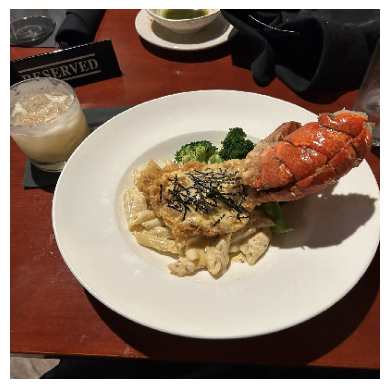

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 67ms/step


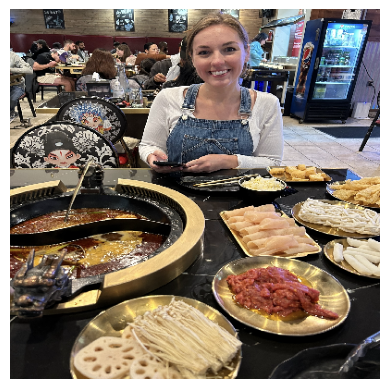

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 64ms/step


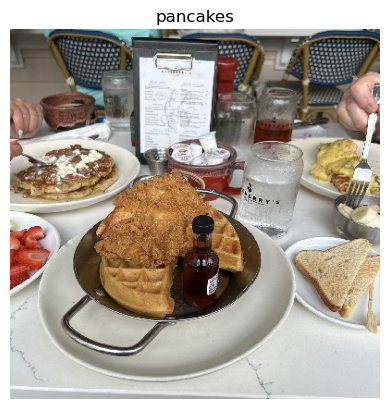

The model is 30.08% certain that the image is pancakes
pancakes have 4.05 grams of protein, 0.38 grams of fat, 45.4 grams of carbohydrates, and 207.0 calories.
1/1 [==============================] - 0s 65ms/step


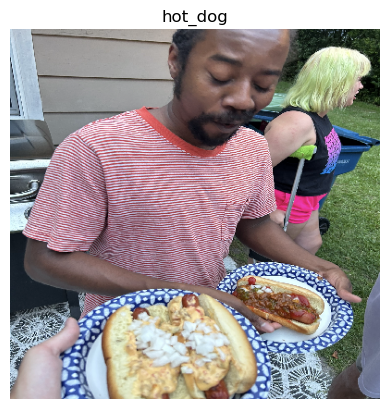

The model is 89.66% certain that the image is hot_dog
hot_dog have 11.2 grams of protein, 16.0 grams of fat, 27.3 grams of carbohydrates, and 305.0 calories.
1/1 [==============================] - 0s 81ms/step


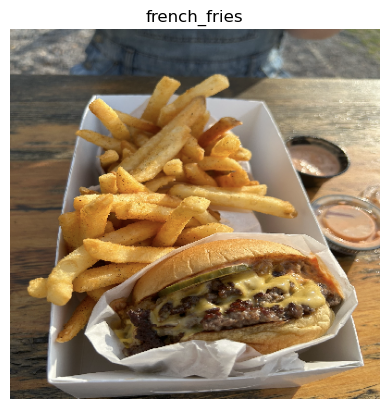

The model is 34.33% certain that the image is french_fries
french_fries have 8.0 grams of protein, 34.0 grams of fat, 96.0 grams of carbohydrates, and 730.0 calories.
1/1 [==============================] - 0s 67ms/step


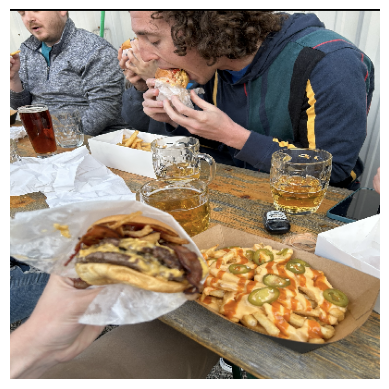

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 69ms/step


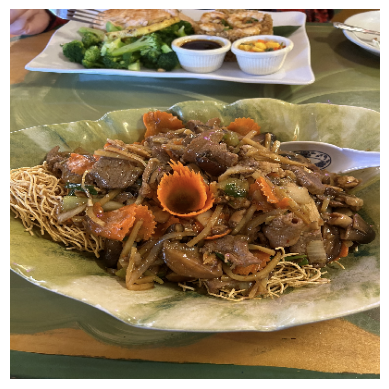

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 69ms/step


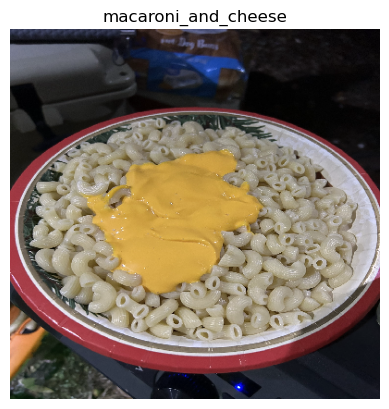

The model is 48.50% certain that the image is macaroni_and_cheese
macaroni_and_cheese have 19.4 grams of protein, 32.0 grams of fat, 94.0 grams of carbohydrates, and 752.0 calories.
1/1 [==============================] - 0s 65ms/step


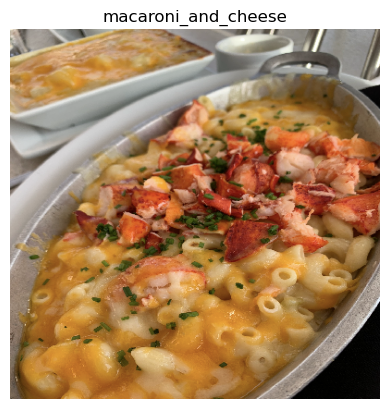

The model is 96.14% certain that the image is macaroni_and_cheese
macaroni_and_cheese have 19.4 grams of protein, 32.0 grams of fat, 94.0 grams of carbohydrates, and 752.0 calories.
1/1 [==============================] - 0s 67ms/step


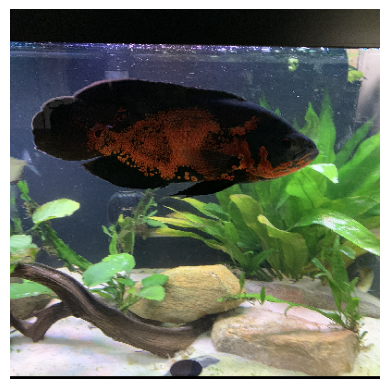

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 66ms/step


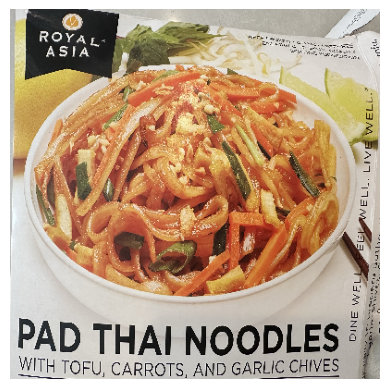

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 80ms/step


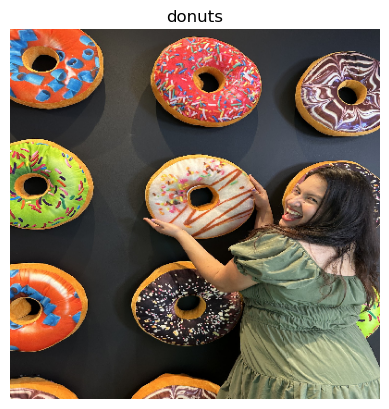

The model is 99.75% certain that the image is donuts
donuts have 4.5 grams of protein, 19.9 grams of fat, 59.5 grams of carbohydrates, and 136.0 calories.
1/1 [==============================] - 0s 70ms/step


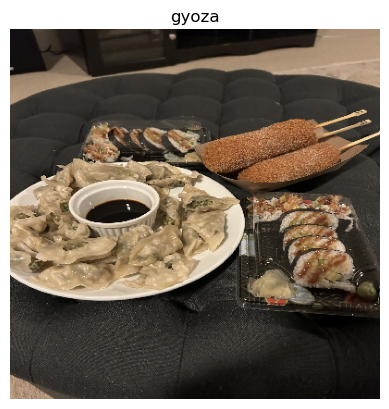

The model is 84.30% certain that the image is gyoza
gyoza have 3.5 grams of protein, 3.8 grams of fat, 7.4 grams of carbohydrates, and 79.0 calories.
1/1 [==============================] - 0s 67ms/step


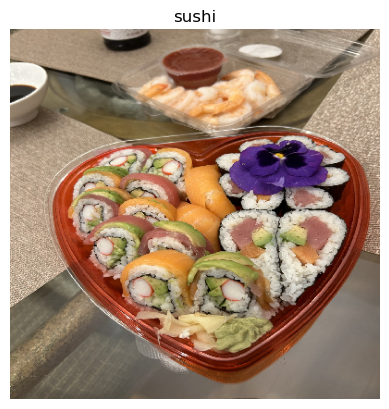

The model is 97.80% certain that the image is sushi
sushi have 2.92 grams of protein, 0.67 grams of fat, 18.4 grams of carbohydrates, and 94.0 calories.
1/1 [==============================] - 0s 64ms/step


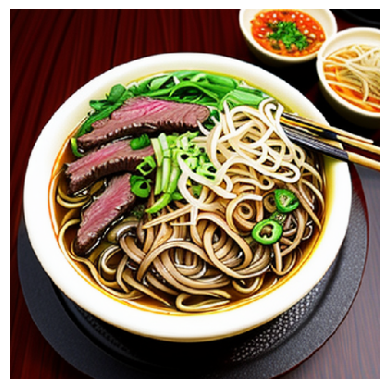

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 66ms/step


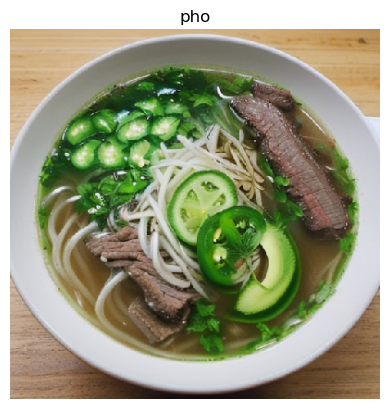

The model is 99.25% certain that the image is pho
pho have 6.15 grams of protein, 2.26 grams of fat, 10.4 grams of carbohydrates, and 89.0 calories.
1/1 [==============================] - 0s 72ms/step


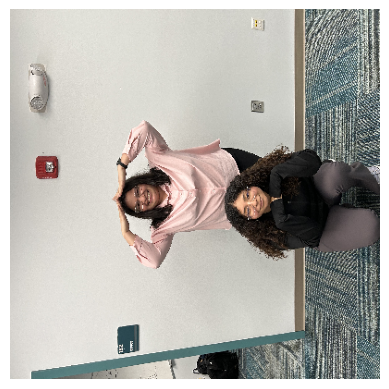

This image may not contain a food trained in this model or may not 
 contain food, otherwise please retake the picture and try again.
1/1 [==============================] - 0s 70ms/step


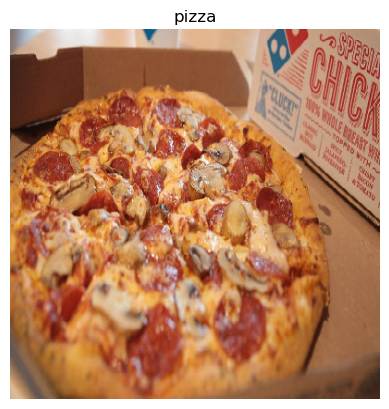

The model is 99.28% certain that the image is pizza
pizza have 1.86 grams of protein, 7.54 grams of fat, 32.3 grams of carbohydrates, and 204.0 calories.
1/1 [==============================] - 0s 68ms/step


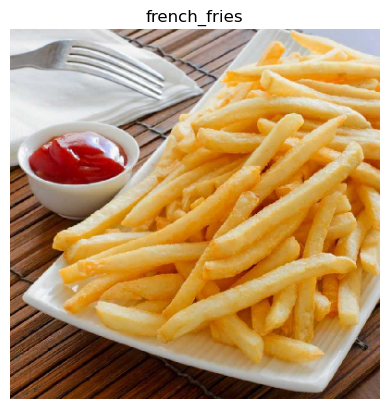

The model is 99.79% certain that the image is french_fries
french_fries have 8.0 grams of protein, 34.0 grams of fat, 96.0 grams of carbohydrates, and 730.0 calories.
1/1 [==============================] - 0s 66ms/step


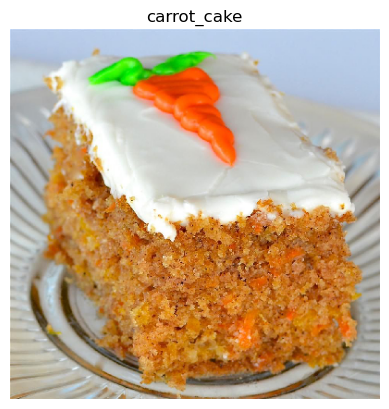

The model is 96.25% certain that the image is carrot_cake
carrot_cake have 6.6 grams of protein, 30.0 grams of fat, 73.0 grams of carbohydrates, and 577.0 calories.
1/1 [==============================] - 0s 68ms/step


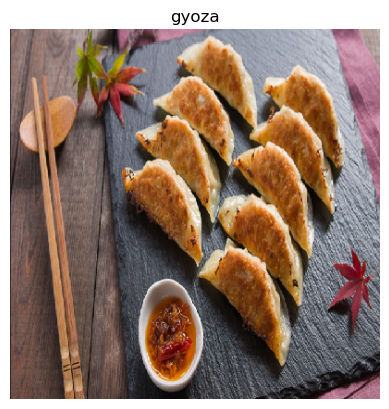

The model is 71.37% certain that the image is gyoza
gyoza have 3.5 grams of protein, 3.8 grams of fat, 7.4 grams of carbohydrates, and 79.0 calories.
1/1 [==============================] - 0s 70ms/step


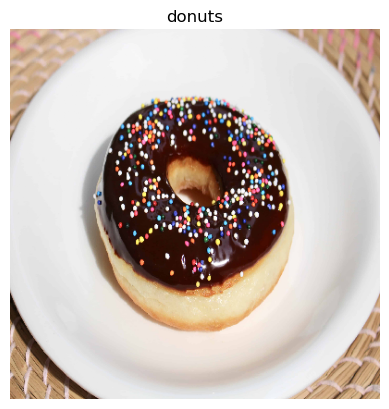

The model is 80.29% certain that the image is donuts
donuts have 4.5 grams of protein, 19.9 grams of fat, 59.5 grams of carbohydrates, and 136.0 calories.
1/1 [==============================] - 0s 67ms/step


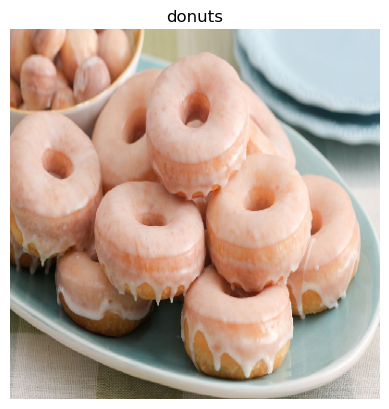

The model is 100.00% certain that the image is donuts
donuts have 4.5 grams of protein, 19.9 grams of fat, 59.5 grams of carbohydrates, and 136.0 calories.
1/1 [==============================] - 0s 65ms/step


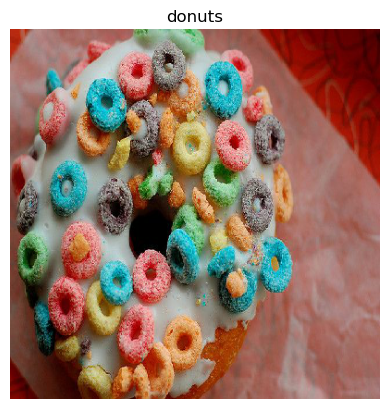

The model is 97.74% certain that the image is donuts
donuts have 4.5 grams of protein, 19.9 grams of fat, 59.5 grams of carbohydrates, and 136.0 calories.
1/1 [==============================] - 0s 64ms/step


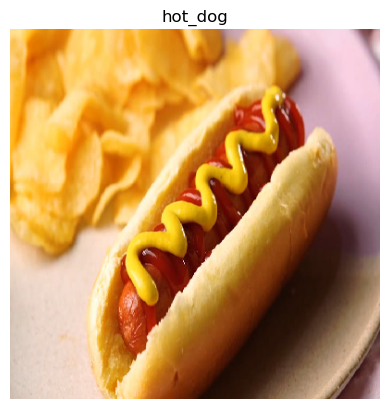

The model is 79.69% certain that the image is hot_dog
hot_dog have 11.2 grams of protein, 16.0 grams of fat, 27.3 grams of carbohydrates, and 305.0 calories.
1/1 [==============================] - 0s 65ms/step


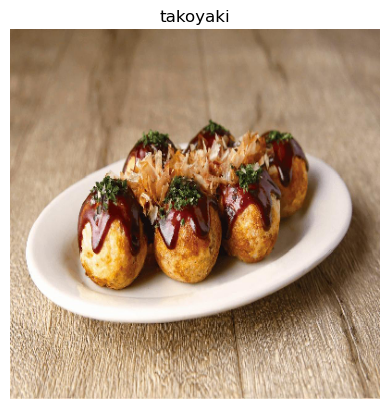

The model is 98.25% certain that the image is takoyaki
takoyaki have 3.0 grams of protein, 2.5 grams of fat, 5.8 grams of carbohydrates, and 58.0 calories.


In [74]:
df2 = pd.read_csv("Food_Macronutrients.csv")

def get_class_label(class_index):
    return class_map_101.get(class_index, None)

def predict_class(model, images, foods_sorted, show=True):
    for img in images:
        img = image.load_img(img, target_size=(400, 400))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = img / 255.

        pred = model.predict(img)
        index = np.argmax(pred)
        pred_value = foods_sorted[index]
        top_prob = np.max(pred) * 100

        if top_prob < 20:
      
            plt.imshow(img[0])
            plt.axis('off')
            
            plt.show()
            print("This image may not contain a food trained in this model or may not \n contain food, otherwise please retake the picture and try again.")
        else:
            if show:
                plt.imshow(img[0])
                plt.axis('off')
                plt.title(pred_value)
                plt.show()

            print(f"The model is {top_prob:.2f}% certain that the image is {pred_value}")

            df_with_info = df[df['Food']==pred_value]
            if len(df_with_info) == 0:
                print("Prediction unavailable")
            else:
                print(f"{pred_value} have {df_with_info['Protein_Grams'].values[0]} grams of protein, {df_with_info['Fat_Grams'].values[0]} grams of fat, {df_with_info['Carbohydrate_Grams'].values[0]} grams of carbohydrates, and {df_with_info['Calories'].values[0]} calories.")

images = [
    'IMG_1885.png',
    'IMG_1886.png',
    'IMG_1888.png',
    'IMG_1889.png',
    'IMG_1896.png',
    'IMG_1898.png',
    'IMG_1901.png',
    'IMG_1903.png',
    'IMG_1907.png',
    'IMG_1911.png',
    'pawarisa_padthai.jpg',
    'maria_doughnut.jpg',
    'Maria_sushi.jpg',
    'maria_sushi_2.jpg',
    'joey_pho.png',
    'joey_pho_2.png',
    'cupcakegirls.jpeg',
    'pizza.jpg', 
    'frenchfries.jpg',
    'matt_ C_A_R_R_O_T_C_A_K_E.jpg',
    'matt_ G_Y_O_Z_A.jpg',
    'matt_donut.jpeg',
    'Matt_donuts.jpg',
    'Matt_donuts_fruitloops.jpg',
    'Matt_hot_dog.jpg', 
    'Matt_takoyaki.jpg']

predict_class(model_best, images, foods_sorted, True)

# Attempt to be able to capture two foods in one image

1/1 [==============================] - 0s 70ms/step


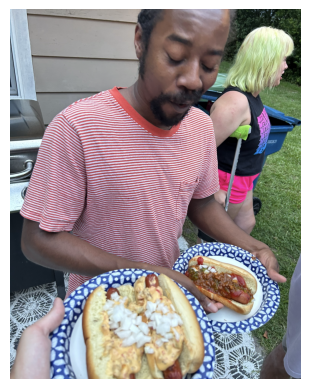

The model is 89.66% certain that the image is hot_dog
The model is also 0.97% certain that the image is hamburger
hot_dog has 11.2 grams of protein, 16.0 grams of fat, 27.3 grams of carbohydrates, and 305.0 calories.
hamburger has 13.3 grams of protein, 10.2 grams of fat, 29.6 grams of carbohydrates, and 263.0 calories.
1/1 [==============================] - 0s 70ms/step


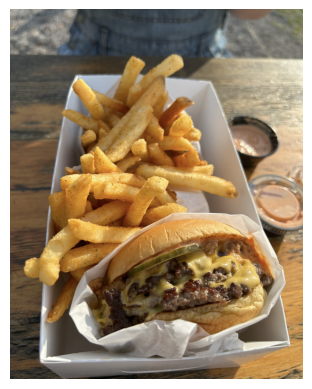

The model is 34.33% certain that the image is french_fries
The model is also 28.65% certain that the image is hamburger
french_fries has 8.0 grams of protein, 34.0 grams of fat, 96.0 grams of carbohydrates, and 730.0 calories.
hamburger has 13.3 grams of protein, 10.2 grams of fat, 29.6 grams of carbohydrates, and 263.0 calories.


In [35]:
df2 = pd.read_csv("Food_Macronutrients.csv")

def get_class_label(class_index):
    return class_map_101.get(class_index, None)

def predict_class(model, images, foods_sorted, show=True):
    for img in images:
        img_path = img
        img = image.load_img(img_path, target_size=(400, 400))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = img / 255.

        pred = model.predict(img)
        indices = np.argsort(pred)[0][::-1]  
        pred_values = [foods_sorted[idx] for idx in indices]
        pred_probs = pred[0][indices]

        plt.imshow(image.load_img(img_path))
        plt.axis('off')
        plt.show()

        top_pred_value = pred_values[0]
        top_pred_prob = pred_probs[0] * 100
        print(f"The model is {top_pred_prob:.2f}% certain that the image is {top_pred_value}")

        second_pred_value = pred_values[1]
        second_pred_prob = pred_probs[1] * 100
        print(f"The model is also {second_pred_prob:.2f}% certain that the image is {second_pred_value}")

        df_with_info_top = df[df['Food'] == top_pred_value]
        df_with_info_second = df[df['Food'] == second_pred_value]

        if len(df_with_info_top) == 0:
            print("Top prediction unavailable")
        else:
            protein_grams_top = df_with_info_top['Protein_Grams'].values[0]
            fat_grams_top = df_with_info_top['Fat_Grams'].values[0]
            carb_grams_top = df_with_info_top['Carbohydrate_Grams'].values[0]
            calories_top = df_with_info_top['Calories'].values[0]
            nutrients_str_top = f"{top_pred_value} has {protein_grams_top} grams of protein, {fat_grams_top} grams of fat, {carb_grams_top} grams of carbohydrates, and {calories_top} calories."
            print(nutrients_str_top)

        if len(df_with_info_second) == 0:
            print("Second prediction unavailable")
        else:
            protein_grams_second = df_with_info_second['Protein_Grams'].values[0]
            fat_grams_second = df_with_info_second['Fat_Grams'].values[0]
            carb_grams_second = df_with_info_second['Carbohydrate_Grams'].values[0]
            calories_second = df_with_info_second['Calories'].values[0]
            nutrients_str_second = f"{second_pred_value} has {protein_grams_second} grams of protein, {fat_grams_second} grams of fat, {carb_grams_second} grams of carbohydrates, and {calories_second} calories."
            print(nutrients_str_second)
images = [
    'IMG_1889.png',
    'IMG_1896.png',
    ]
predict_class(model_best, images, foods_sorted, True)

# CODE BELOW IS TAKEN FROM A GOOGLE COLAB FILE FOR PROOF OF CONCEPT AND WHAT OUR NEXT STEPS WOULD BE DUE TO DIVE SERVER CRASHING ( Apple Images imported to show the code worked in colab) 

Copyright 2020 The TensorFlow Hub Authors.
Licensed under the Apache License, Version 2.0 (the "License");

In [5]:
#@title Copyright 2020 The TensorFlow Hub Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

View on TensorFlow.org	Run in Google Colab	View on GitHub	Download notebook	See TF Hub models

# TensorFlow Hub Object Detection Colab

Welcome to the TensorFlow Hub Object Detection Colab! This notebook will take you through the steps of running an "out-of-the-box" object detection model on images.

### More models
[This](https://tfhub.dev/tensorflow/collections/object_detection/1) collection contains TF2 object detection models that have been trained on the COCO 2017 dataset. [Here](https://tfhub.dev/s?module-type=image-object-detection) you can find all object detection models that are currently hosted on [tfhub.dev](https://tfhub.dev/).

## Imports and Setup

Let's start with the base imports.

In [ ]:
# This Colab requires a recent numpy version.
!pip install numpy==1.24.3
!pip install protobuf==3.20.3

Requirement already satisfied: numpy==1.24.3 in /usr/local/lib/python3.10/dist-packages (1.24.3) <br>
Requirement already satisfied: protobuf==3.20.3 in /usr/local/lib/python3.10/dist-packages (3.20.3)

In [ ]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

### Utilities

Run the following cell to create some utils that will be needed later:

- Helper method to load an image
- Map of Model Name to TF Hub handle
- List of tuples with Human Keypoints for the COCO 2017 dataset. This is needed for models with keypoints.

In [ ]:
# @title Run this!!

def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)


ALL_MODELS = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
}

IMAGES_FOR_TEST = {
  'Beach' : 'models/research/object_detection/test_images/image2.jpg',
  'Dogs' : 'models/research/object_detection/test_images/image1.jpg',
  # By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
  'Naxos Taverna' : 'https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  'Beatles' : 'https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg',
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  'Phones' : 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  'Birds' : 'https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg',
}

COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

## Visualization tools

To visualize the images with the proper detected boxes, keypoints and segmentation, we will use the TensorFlow Object Detection API. To install it we will clone the repo.

In [ ]:
# Clone the tensorflow models repository
!git clone --depth 1 https://github.com/tensorflow/models

Installing the Object Detection API

In [ ]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .


Now we can import the dependencies we will need later

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline

### Load label map data (for plotting).

Label maps correspond index numbers to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine.

We are going, for simplicity, to load from the repository that we loaded the Object Detection API code

In [ ]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

## Build a detection model and load pre-trained model weights

Here we will choose which Object Detection model we will use.
Select the architecture and it will be loaded automatically.
If you want to change the model to try other architectures later, just change the next cell and execute following ones.

**Tip:** if you want to read more details about the selected model, you can follow the link (model handle) and read additional documentation on TF Hub. After you select a model, we will print the handle to make it easier.

In [ ]:
#@title Model Selection { display-mode: "form", run: "auto" }
model_display_name = 'CenterNet Resnet50 V1 FPN 512x512' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']
model_handle = ALL_MODELS[model_display_name]

print('Selected model:'+ model_display_name)
print('Model Handle at TensorFlow Hub: {}'.format(model_handle))

Selected model:CenterNet Resnet50 V1 FPN 512x512 <br>
Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1

## Loading the selected model from TensorFlow Hub

Here we just need the model handle that was selected and use the Tensorflow Hub library to load it to memory.

In [ ]:
print('loading model...')
hub_model = hub.load(model_handle)
print('model loaded!')

loading model...<br>
model loaded!

## Loading an image

Let's try the model on a simple image. To help with this, we provide a list of test images.

Here are some simple things to try out if you are curious:
* Try running inference on your own images, just upload them to colab and load the same way it's done in the cell below.
* Modify some of the input images and see if detection still works.  Some simple things to try out here include flipping the image horizontally, or converting to grayscale (note that we still expect the input image to have 3 channels).

**Be careful:** when using images with an alpha channel, the model expect 3 channels images and the alpha will count as a 4th.

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

  selected_image = fn


No file chosen
Upload widget is only available when the cell has been executed in the current browser session. Please rerun this cell to enable.
Saving 2 grn apples (1).jpg to 2 grn apples (1) (1).jpg
User uploaded file "2 grn apples (1) (1).jpg" with length 268892 bytes

In [ ]:
#@title Image Selection (don't forget to execute the cell!) { display-mode: "form"}
selected_image = selected_image
flip_image_horizontally = False #@param {type:"boolean"}
convert_image_to_grayscale = False #@param {type:"boolean"}

image_path = image_path = list(uploaded.keys())[0]
image_np = image_np = load_image_into_numpy_array(image_path)

# OPTIONAL: Flip horizontally
if(flip_image_horizontally):
  image_np[0] = np.fliplr(image_np[0]).copy()

# OPTIONAL: Convert image to grayscale
if(convert_image_to_grayscale):
  image_np[0] = np.tile(
    np.mean(image_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

plt.figure(figsize=(24,32))
plt.imshow(image_np[0])
plt.show()

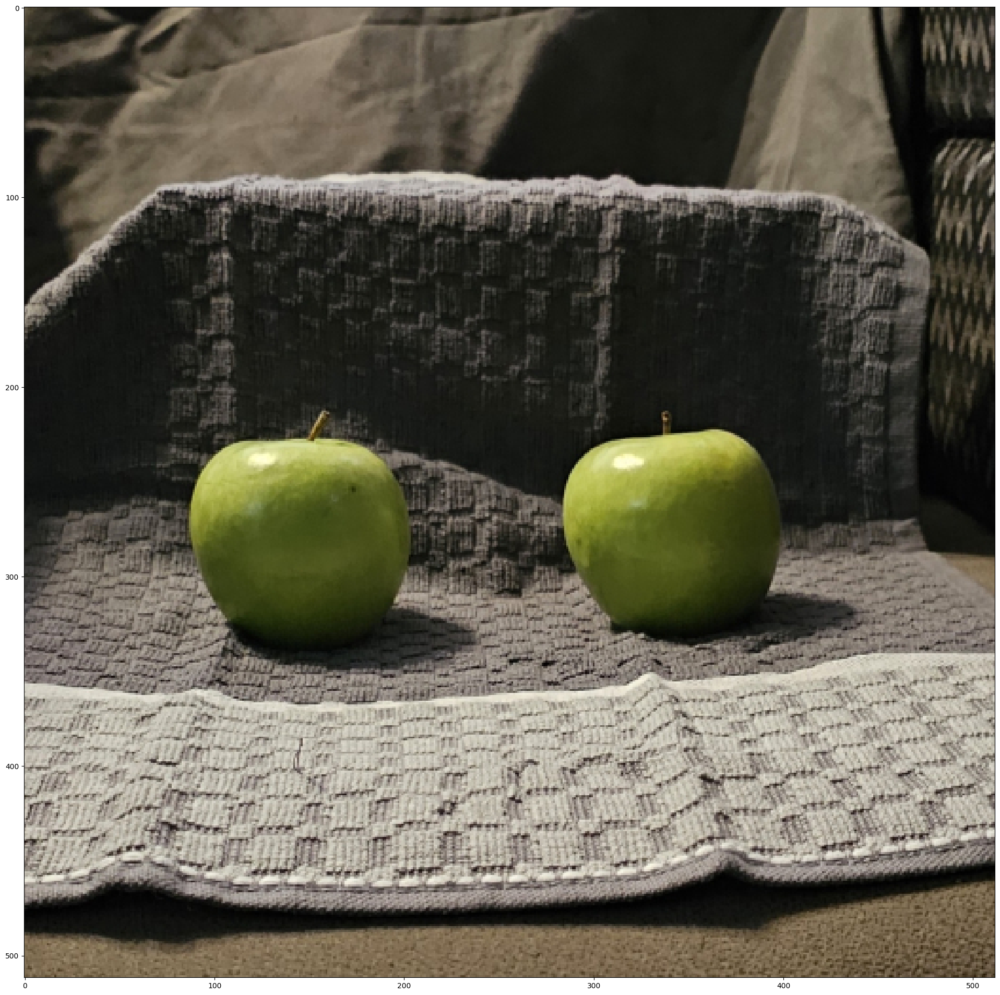

## Doing the inference

To do the inference we just need to call our TF Hub loaded model.

Things you can try:
* Print out `result['detection_boxes']` and try to match the box locations to the boxes in the image.  Notice that coordinates are given in normalized form (i.e., in the interval [0, 1]).
* inspect other output keys present in the result. A full documentation can be seen on the models documentation page (pointing your browser to the model handle printed earlier)

In [ ]:
# running inference
results = hub_model(image_np)

# different object detection models have additional results
# all of them are explained in the documentation
result = {key:value.numpy() for key,value in results.items()}
print(result.keys())

dict_keys(['detection_boxes', 'num_detections', 'detection_scores', 'detection_classes'])

## Visualizing the results

Here is where we will need the TensorFlow Object Detection API to show the squares from the inference step (and the keypoints when available).

the full documentation of this method can be seen [here](https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py)

Here you can, for example, set `min_score_thresh` to other values (between 0 and 1) to allow more detections in or to filter out more detections.

In [ ]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in result:
  keypoints = result['detection_keypoints'][0]
  keypoint_scores = result['detection_keypoint_scores'][0]

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=COCO17_HUMAN_POSE_KEYPOINTS)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()

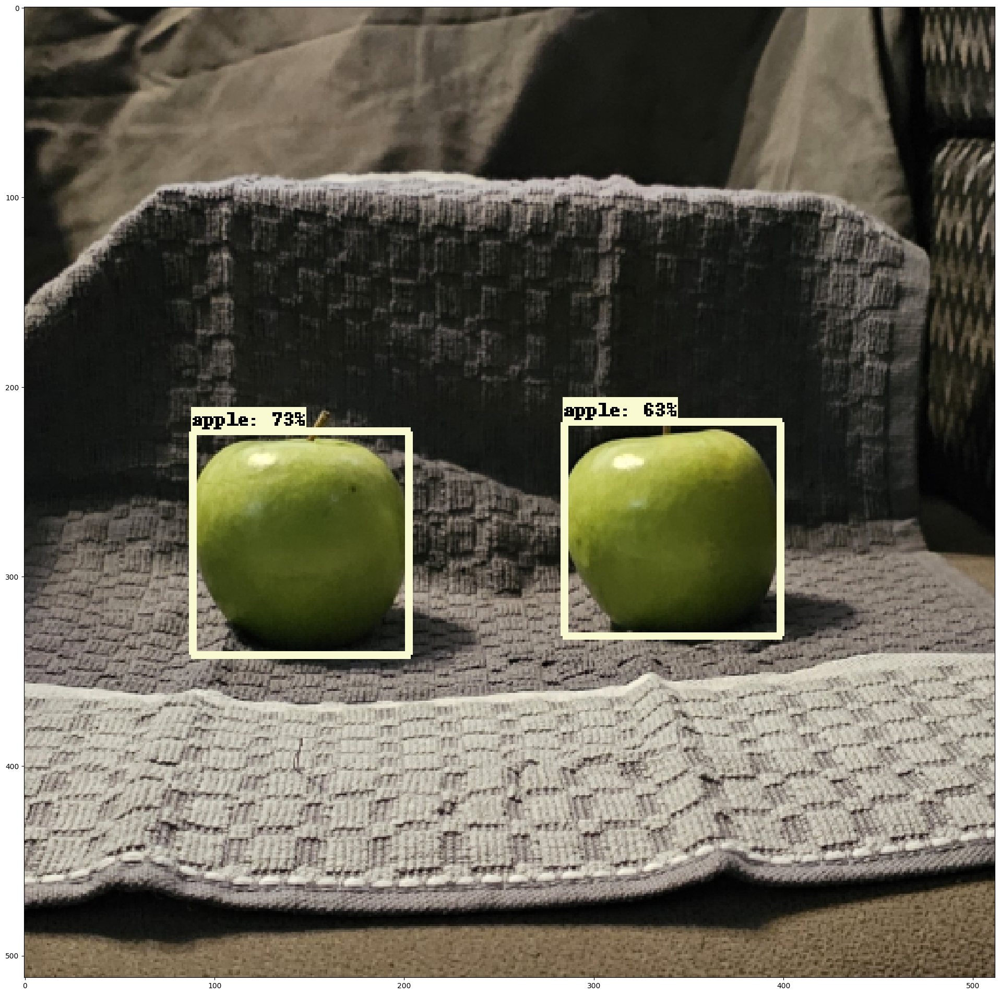

In [ ]:
# prompt: for classes with score over 0.3, count objects detected and bounded in the output image, display the class, convert score to a percentage rounded to a whole number, output should look like Object1: apple, score:73%

objects_detected = {}
for i in range(len(result['detection_scores'][0])):
  if result['detection_scores'][0][i] > 0.3:
    class_id = int(result['detection_classes'][0][i]) + label_id_offset
    class_name = category_index[class_id]['name']
    score = int(result['detection_scores'][0][i] * 100)
    if class_name not in objects_detected:
      objects_detected[class_name] = 1
    else:
      objects_detected[class_name] += 1
    print(f'Object{i + 1}: {class_name}, score: {score}%')


Object1: apple, score: 72%<br>
Object2: apple, score: 62%

In [ ]:
def get_detection_info(result, category_index):
  """
  Returns a list of detection information for the given result.

  Args:
    result: The result of the object detection model.
    category_index: The category index.

  Returns:
    A list of dictionaries, each containing the following information:
      - name: The name of the detected object.
      - count: The number of times the object was detected.
      - score: The detection score.
      - total_detections: The total number of detections.
      - class_detections: A dictionary of class names and their counts.
  """

  # Get the detection boxes, classes, and scores.
  detection_boxes = result['detection_boxes'][0]
  detection_classes = result['detection_classes'][0] + label_id_offset
  detection_scores = result['detection_scores'][0]

  # Get the unique detection classes and their counts.
  unique_classes, class_counts = np.unique(detection_classes, return_counts=True)

  # Create a list of detection information dictionaries.
  detection_info = []
  for class_id, class_count in zip(unique_classes, class_counts):
    class_name = category_index[class_id]['name']
    detection_info.append({
      'name': class_name,
      'count': class_count,
      'score': detection_scores[detection_classes == class_id].max(),
      'total_detections': len(detection_boxes),
      'class_detections': {class_name: class_count}
    })

  return detection_info

detection_info = get_detection_info(result, category_index)

# Print the detection information.
for detection in detection_info:
  print(f"{detection['name']}: {detection['count']} (score: {detection['score']})")

person: 9 (score: 0.04650647193193436)<br>
bench: 7 (score: 0.10460194200277328)<br>
cat: 1 (score: 0.03353101387619972)<br>
dog: 3 (score: 0.043271105736494064)<br>
cow: 1 (score: 0.04950254037976265)<br>
elephant: 2 (score: 0.028549911454319954)<br>
backpack: 2 (score: 0.030817152932286263)<br>
handbag: 5 (score: 0.07581861317157745)<br>
suitcase: 3 (score: 0.04136497527360916)<br>
sports ball: 2 (score: 0.2589944899082184)<br>
bowl: 2 (score: 0.03468260541558266)<br>
apple: 4 (score: 0.7258663177490234)<br>
orange: 2 (score: 0.17011378705501556)<br>
donut: 1 (score: 0.030516579747200012)<br>
cake: 1 (score: 0.03193371370434761)<br>
chair: 11 (score: 0.1098889410495758)<br>
couch: 27 (score: 0.2578458786010742)<br>
bed: 3 (score: 0.03849594667553902)<br>
dining table: 13 (score: 0.17936088144779205)<br>
toilet: 1 (score: 0.02771676890552044)